# Hospital Data Visualization 1

## Importing required libraries

In [1]:
#for algebra and data processing
import numpy as np
import pandas as pd
import collections
import seaborn as sns
import chardet
import matplotlib.pyplot as plt
from datetime import datetime
# Libreria para el modelado
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.externals import joblib
# Libreria para ver los modelos de entrenamiento
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

import warnings

warnings.filterwarnings('ignore')

In [2]:
# look at the first ten thousand bytes to guess the character encoding
with open('01.csv', 'rb') as rawdata:
    result = chardet.detect(rawdata.read(10000))

# check what the character encoding might be
print(result)

{'encoding': 'ISO-8859-1', 'confidence': 0.7108971962616822, 'language': ''}


## Reading the Data

In [3]:
df=pd.read_csv('01covid.csv',encoding='ISO-8859-1',sep=';',index_col='PATIENT ID',parse_dates=True,dayfirst=True)

## Checking the Data

In [4]:
#visualizamos todas las columnas
pd.set_option('display.max_columns', None)
df.head(50)

,EDAD/AGE,SEXO/SEX,DIAG ING/INPAT,F_INGRESO/ADMISSION_D_ING/INPAT,F_ENTRADA_UC/ICU_DATE_IN,F_SALIDA_UCI/ICU_DATE_OUT,UCI_DIAS/ICU_DAYS,F_ALTA/DISCHARGE_DATE_ING,MOTIVO_ALTA/DESTINY_DISCHARGE_ING,F_INGRESO/ADMISSION_DATE_URG/EMERG,HORA/TIME_ADMISION/ADMISSION_URG/EMERG,ESPECIALIDAD/DEPARTMENT_URG/EMERG,DIAG_URG/EMERG,DESTINO/DESTINY_URG/EMERG,HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG,TEMP_PRIMERA/FIRST_URG/EMERG,FC/HR_PRIMERA/FIRST_URG/EMERG,GLU_PRIMERA/FIRST_URG/EMERG,SAT_02_PRIMERA/FIRST_URG/EMERG,TA_MAX_PRIMERA/FIRST/EMERG_URG,TA_MIN_PRIMERA/FIRST_URG/EMERG,HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG,FC/HR_ULTIMA/LAST_URG/EMERG,TEMP_ULTIMA/LAST_URG/EMERG,GLU_ULTIMA/LAST_URG/EMERG,SAT_02_ULTIMA/LAST_URG/EMERG,TA_MAX_ULTIMA/LAST_URGEMERG,TA_MIN_ULTIMA/LAST_URG/EMERG
PATIENT ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
577,78,MALE,COVID19 - POSITIVO,26/12/19,26/12/19,27/12/19,1.0,2/4/20,Domicilio,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,0,0,0,0,NaN,0,0,0,0,0,0
44,75,FEMALE,COVID19 - POSITIVO,28/1/20,30/1/20,31/1/20,1.0,4/4/20,Domicilio,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,0,0,0,0,NaN,0,0,0,0,0,0
585,62,FEMALE,COVID19 - POSITIVO,5/2/20,10/3/20,20/3/20,10.0,26/3/20,Domicilio,5/2/20,18:21:00,Medicina de Urgencias,DOLOR COSTAL,Ingreso,18:27:00,0.0,105,0,97,160,101,18:34:00,105,0,0,97,160,101
587,69,MALE,COVID19 - POSITIVO,6/2/20,NaN,NaN,NaN,24/3/20,Domicilio,6/2/20,15:27:00,Medicina de Urgencias,DETERIORO PACIENTE ONCOLàGICO,Ingreso,15:35:00,37.1,92,0,95,141,83,18:54:00,92,37,0,95,141,83
586,67,FEMALE,COVID19 - POSITIVO,6/2/20,NaN,NaN,NaN,28/3/20,Fallecimiento,6/2/20,0:34:00,Medicina Interna,DIFICULTAD RESPIRATORIA,Ingreso,0:41:00,36.0,84,0,93,151,82,0:55:00,84,36,0,93,151,82
588,72,MALE,COVID19 - POSITIVO,24/2/20,NaN,NaN,NaN,23/3/20,Domicilio,24/2/20,0:38:00,Medicina de Urgencias,DETERIORO PACIENTE ONCOLàGICO,Ingreso,0:46:00,37.8,80,0,99,146,71,0:57:00,80,38,0,99,146,71
589,55,MALE,COVID19 - PENDIENTE,27/2/20,NaN,NaN,NaN,28/2/20,Domicilio,27/2/20,8:39:00,Medicina de Urgencias,CUADRO CATARRAL,Ingreso,9:59:00,35.9,0,0,0,0,0,8:58:00,0,0,0,0,0,0
590,86,FEMALE,COVID19 - POSITIVO,1/3/20,5/3/20,7/3/20,2.0,10/3/20,Fallecimiento,1/3/20,16:17:00,Medicina de Urgencias,NµUSEAS/VàMITOS,Ingreso,17:01:00,35.6,0,0,0,53,32,16:55:00,85,36,0,0,53,32
593,29,MALE,COVID19 - PENDIENTE,2/3/20,NaN,NaN,NaN,5/3/20,Domicilio,2/3/20,17:08:00,Medicina de Urgencias,CUADRO CATARRAL,Ingreso,NaN,0.0,0,0,0,0,0,19:54:00,0,0,0,0,0,0


In [5]:
df.columns

Index(['EDAD/AGE', 'SEXO/SEX', 'DIAG ING/INPAT',
       'F_INGRESO/ADMISSION_D_ING/INPAT', 'F_ENTRADA_UC/ICU_DATE_IN',
       'F_SALIDA_UCI/ICU_DATE_OUT', 'UCI_DIAS/ICU_DAYS',
       'F_ALTA/DISCHARGE_DATE_ING', 'MOTIVO_ALTA/DESTINY_DISCHARGE_ING',
       'F_INGRESO/ADMISSION_DATE_URG/EMERG',
       'HORA/TIME_ADMISION/ADMISSION_URG/EMERG',
       'ESPECIALIDAD/DEPARTMENT_URG/EMERG', 'DIAG_URG/EMERG',
       'DESTINO/DESTINY_URG/EMERG',
       'HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG',
       'TEMP_PRIMERA/FIRST_URG/EMERG', 'FC/HR_PRIMERA/FIRST_URG/EMERG',
       'GLU_PRIMERA/FIRST_URG/EMERG', 'SAT_02_PRIMERA/FIRST_URG/EMERG',
       'TA_MAX_PRIMERA/FIRST/EMERG_URG', 'TA_MIN_PRIMERA/FIRST_URG/EMERG',
       'HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG',
       'FC/HR_ULTIMA/LAST_URG/EMERG', 'TEMP_ULTIMA/LAST_URG/EMERG',
       'GLU_ULTIMA/LAST_URG/EMERG', 'SAT_02_ULTIMA/LAST_URG/EMERG',
       'TA_MAX_ULTIMA/LAST_URGEMERG', 'TA_MIN_ULTIMA/LAST_URG/EMERG'],
      dtype='object')

In [6]:
#número de entradas y columnas
df.shape

(2307, 28)

In [7]:
df.describe()

,EDAD/AGE,UCI_DIAS/ICU_DAYS,TEMP_PRIMERA/FIRST_URG/EMERG,FC/HR_PRIMERA/FIRST_URG/EMERG,GLU_PRIMERA/FIRST_URG/EMERG,SAT_02_PRIMERA/FIRST_URG/EMERG,TA_MAX_PRIMERA/FIRST/EMERG_URG,TA_MIN_PRIMERA/FIRST_URG/EMERG,FC/HR_ULTIMA/LAST_URG/EMERG,TEMP_ULTIMA/LAST_URG/EMERG,GLU_ULTIMA/LAST_URG/EMERG,SAT_02_ULTIMA/LAST_URG/EMERG,TA_MAX_ULTIMA/LAST_URGEMERG,TA_MIN_ULTIMA/LAST_URG/EMERG
count,2307.000000,201.000000,2307.000000,2307.000000,2307.000000,2307.000000,2307.000000,2307.000000,2307.000000,2307.000000,2307.000000,2307.000000,2307.000000,2307.000000
mean,67.599046,7.139303,28.005028,69.340269,1.961855,72.394452,83.437798,48.182488,73.991331,29.114434,2.308192,77.016905,88.669701,50.982228
std,16.599775,8.528804,15.650781,40.702173,21.006696,38.552040,65.904007,43.533461,37.970088,15.065048,22.712959,34.882782,64.380463,40.422059
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,57.000000,1.000000,35.200000,60.000000,0.000000,78.000000,0.000000,0.000000,69.000000,36.000000,0.000000,85.000000,0.000000,0.000000
50%,69.000000,4.000000,36.400000,83.000000,0.000000,93.000000,115.000000,64.000000,85.000000,36.000000,0.000000,93.000000,118.000000,67.000000
75%,80.000000,10.000000,36.900000,97.000000,0.000000,96.000000,137.000000,79.000000,99.000000,37.000000,0.000000,96.000000,138.500000,80.000000
max,106.000000,37.000000,40.100000,190.000000,448.000000,99.000000,220.000000,845.000000,190.000000,89.000000,448.000000,99.000000,220.000000,845.000000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2307 entries, 577 to 284
Data columns (total 28 columns):
EDAD/AGE                                      2307 non-null int64
SEXO/SEX                                      2307 non-null object
DIAG ING/INPAT                                2307 non-null object
F_INGRESO/ADMISSION_D_ING/INPAT               2307 non-null object
F_ENTRADA_UC/ICU_DATE_IN                      219 non-null object
F_SALIDA_UCI/ICU_DATE_OUT                     201 non-null object
UCI_DIAS/ICU_DAYS                             201 non-null float64
F_ALTA/DISCHARGE_DATE_ING                     2089 non-null object
MOTIVO_ALTA/DESTINY_DISCHARGE_ING             2048 non-null object
F_INGRESO/ADMISSION_DATE_URG/EMERG            2224 non-null object
HORA/TIME_ADMISION/ADMISSION_URG/EMERG        2224 non-null object
ESPECIALIDAD/DEPARTMENT_URG/EMERG             2224 non-null object
DIAG_URG/EMERG                                2224 non-null object
DESTINO/DESTINY_URG/EMER

In [9]:
#We create a copy so as not to damage the original data
pr = df.copy()

## Feature Exploration

In [10]:
# %
pr["DIAG ING/INPAT"].value_counts(normalize=True*100)

COVID19 - POSITIVO     0.899436
COVID19 - PENDIENTE    0.100564
Name: DIAG ING/INPAT, dtype: float64

In [11]:
# values
pr["DIAG ING/INPAT"].value_counts()

COVID19 - POSITIVO     2075
COVID19 - PENDIENTE     232
Name: DIAG ING/INPAT, dtype: int64

In [12]:
#tells us the different values present in the column 'MOTIVO_ALTA/DESTINY_DISCHARGE_ING'
pd.unique(pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'])

array(['Domicilio', 'Fallecimiento', 'Traslado al Hospital', nan,
       'Alta Voluntaria', 'Traslado a un Centro Sociosanitario'],
      dtype=object)

In [13]:
# Nº deceased
collections.Counter(pr["MOTIVO_ALTA/DESTINY_DISCHARGE_ING"] == "Fallecimiento")

Counter({False: 1974, True: 333})

In [14]:
# Decide which categorical variables you want to use in model
for col_name in df.columns:
    if pr[col_name].dtypes == 'object' :
        unique_cat = len(pr[col_name].unique())
        print("Feature '{col_name}' has {unique_cat} unique categories".format(
                col_name=col_name, unique_cat=unique_cat))

Feature 'SEXO/SEX' has 2 unique categories
Feature 'DIAG ING/INPAT' has 2 unique categories
Feature 'F_INGRESO/ADMISSION_D_ING/INPAT' has 56 unique categories
Feature 'F_ENTRADA_UC/ICU_DATE_IN' has 48 unique categories
Feature 'F_SALIDA_UCI/ICU_DATE_OUT' has 46 unique categories
Feature 'F_ALTA/DISCHARGE_DATE_ING' has 50 unique categories
Feature 'MOTIVO_ALTA/DESTINY_DISCHARGE_ING' has 6 unique categories
Feature 'F_INGRESO/ADMISSION_DATE_URG/EMERG' has 55 unique categories
Feature 'HORA/TIME_ADMISION/ADMISSION_URG/EMERG' has 995 unique categories
Feature 'ESPECIALIDAD/DEPARTMENT_URG/EMERG' has 10 unique categories
Feature 'DIAG_URG/EMERG' has 54 unique categories
Feature 'DESTINO/DESTINY_URG/EMERG' has 3 unique categories
Feature 'HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG' has 912 unique categories
Feature 'HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG' has 996 unique categories


In [15]:
#Although, 'times, hours and symptoms' has a lot of unique categories, most categories only have a few observation
print(pr['F_INGRESO/ADMISSION_D_ING/INPAT'].value_counts().sort_values(ascending=False).head(10))

23/3/20    110
24/3/20    109
18/3/20     99
30/3/20     94
20/3/20     90
26/3/20     89
19/3/20     86
28/3/20     84
22/3/20     77
25/3/20     76
Name: F_INGRESO/ADMISSION_D_ING/INPAT, dtype: int64


In [16]:
print(pr['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG'].value_counts().sort_values(ascending=False).head(10))

19:07:00    8
19:21:00    7
20:07:00    7
19:13:00    7
12:39:00    6
19:40:00    6
10:32:00    6
13:40:00    6
15:10:00    6
19:14:00    6
Name: HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG, dtype: int64


In [17]:
#Values NaN
pr.isnull().sum().sort_values(ascending=False)

F_SALIDA_UCI/ICU_DATE_OUT                     2106
UCI_DIAS/ICU_DAYS                             2106
F_ENTRADA_UC/ICU_DATE_IN                      2088
HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG     457
MOTIVO_ALTA/DESTINY_DISCHARGE_ING              259
F_ALTA/DISCHARGE_DATE_ING                      218
DESTINO/DESTINY_URG/EMERG                       83
DIAG_URG/EMERG                                  83
HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG        83
F_INGRESO/ADMISSION_DATE_URG/EMERG              83
HORA/TIME_ADMISION/ADMISSION_URG/EMERG          83
ESPECIALIDAD/DEPARTMENT_URG/EMERG               83
SEXO/SEX                                         0
DIAG ING/INPAT                                   0
F_INGRESO/ADMISSION_D_ING/INPAT                  0
TA_MIN_ULTIMA/LAST_URG/EMERG                     0
TA_MAX_ULTIMA/LAST_URGEMERG                      0
TEMP_PRIMERA/FIRST_URG/EMERG                     0
FC/HR_PRIMERA/FIRST_URG/EMERG                    0
GLU_PRIMERA/FIRST_URG/EMERG    

In [18]:
# % Values NaN
pr.isnull().sum().sort_values(ascending=False)/len(pr.index)*100

F_SALIDA_UCI/ICU_DATE_OUT                     91.287386
UCI_DIAS/ICU_DAYS                             91.287386
F_ENTRADA_UC/ICU_DATE_IN                      90.507152
HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG    19.809276
MOTIVO_ALTA/DESTINY_DISCHARGE_ING             11.226701
F_ALTA/DISCHARGE_DATE_ING                      9.449502
DESTINO/DESTINY_URG/EMERG                      3.597746
DIAG_URG/EMERG                                 3.597746
HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG       3.597746
F_INGRESO/ADMISSION_DATE_URG/EMERG             3.597746
HORA/TIME_ADMISION/ADMISSION_URG/EMERG         3.597746
ESPECIALIDAD/DEPARTMENT_URG/EMERG              3.597746
SEXO/SEX                                       0.000000
DIAG ING/INPAT                                 0.000000
F_INGRESO/ADMISSION_D_ING/INPAT                0.000000
TA_MIN_ULTIMA/LAST_URG/EMERG                   0.000000
TA_MAX_ULTIMA/LAST_URGEMERG                    0.000000
TEMP_PRIMERA/FIRST_URG/EMERG                   0

In [19]:
# % 0 in variables
print(pr[pr == 0].count(axis=0)/len(pr.index))

EDAD/AGE                                      0.003901
SEXO/SEX                                      0.000000
DIAG ING/INPAT                                0.000000
F_INGRESO/ADMISSION_D_ING/INPAT               0.000000
F_ENTRADA_UC/ICU_DATE_IN                      0.000000
F_SALIDA_UCI/ICU_DATE_OUT                     0.000000
UCI_DIAS/ICU_DAYS                             0.017772
F_ALTA/DISCHARGE_DATE_ING                     0.000000
MOTIVO_ALTA/DESTINY_DISCHARGE_ING             0.000000
F_INGRESO/ADMISSION_DATE_URG/EMERG            0.000000
HORA/TIME_ADMISION/ADMISSION_URG/EMERG        0.000000
ESPECIALIDAD/DEPARTMENT_URG/EMERG             0.000000
DIAG_URG/EMERG                                0.000000
DESTINO/DESTINY_URG/EMERG                     0.000000
HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG    0.000000
TEMP_PRIMERA/FIRST_URG/EMERG                  0.237538
FC/HR_PRIMERA/FIRST_URG/EMERG                 0.229302
GLU_PRIMERA/FIRST_URG/EMERG                   0.989597
SAT_02_PRI

In [20]:
#We see that there is data inconsistency on F_ENTRADA_UCI so we are left with the UCI_DIAS
pr.drop(['F_SALIDA_UCI/ICU_DATE_OUT','F_ENTRADA_UC/ICU_DATE_IN','DIAG ING/INPAT'],axis=1, inplace=True)

In [21]:
#We establish its corresponding type of data
pr['F_INGRESO/ADMISSION_D_ING/INPAT']= pd.to_datetime(pr['F_INGRESO/ADMISSION_D_ING/INPAT'])
pr['F_INGRESO/ADMISSION_DATE_URG/EMERG']= pd.to_datetime(pr['F_INGRESO/ADMISSION_DATE_URG/EMERG']) 
pr['F_ALTA/DISCHARGE_DATE_ING']= pd.to_datetime(pr['F_ALTA/DISCHARGE_DATE_ING']) 
pr['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG']= pd.to_datetime(pr['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG']) 
pr['HORA/TIME_ADMISION/ADMISSION_URG/EMERG']= pd.to_datetime(pr['HORA/TIME_ADMISION/ADMISSION_URG/EMERG']) 
pr['HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG']= pd.to_datetime(pr['HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG']) 

In [22]:
#We treat dual categorical variables
pr['SEXO/SEX'] = np.where(pr['SEXO/SEX'] == 'FEMALE', 0, 1)

we treat all patients as with covid

In [23]:
# DESTINO / DESTINY_URG / EMERG all are analyzes on admitted patients, so we ignore this column since there are only two of one type and other NaN
pr.drop(['DESTINO/DESTINY_URG/EMERG'],axis=1, inplace=True)

In [24]:
#Fill the null values of UCI_DIAS / ICU_DAYS to the value 0
pr['UCI_DIAS/ICU_DAYS'].fillna(0, inplace=True)
pr['UCI_DIAS/ICU_DAYS'] = pr['UCI_DIAS/ICU_DAYS'].astype(int)

In [25]:
pr['F_INGRESO/ADMISSION_D_ING/INPAT'] = pr['F_INGRESO/ADMISSION_D_ING/INPAT'].dt.month
pr['F_INGRESO/ADMISSION_DATE_URG/EMERG'] = pr['F_INGRESO/ADMISSION_DATE_URG/EMERG'].dt.month
pr['F_ALTA/DISCHARGE_DATE_ING'] = pr['F_ALTA/DISCHARGE_DATE_ING'].dt.month 
pr['HORA/TIME_ADMISION/ADMISSION_URG/EMERG'] = pr['HORA/TIME_ADMISION/ADMISSION_URG/EMERG'].dt.hour
pr['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG'] = pr['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG'].dt.hour 
pr['HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG'] = pr['HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG'].dt.hour 

In [26]:
# We see that there is data inconsistency since if there is a registration date it must be justified
print("NaN_F_ALTA/DISCHARGE_DATE_ING =",pr['F_ALTA/DISCHARGE_DATE_ING'].isnull().mean() * 100,"%")
print("NaN_MOTIVO_ALTA/DESTINY_DISCHARGE_ING =",pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'].isnull().mean() * 100,"%")

NaN_F_ALTA/DISCHARGE_DATE_ING = 9.449501517121803 %
NaN_MOTIVO_ALTA/DESTINY_DISCHARGE_ING = 11.226701343736455 %


In [27]:
# We are going to ignore these people who are still under investigation and due to the lack of information, we leave it for testing
pr = pr[pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'].notnull()]

In [28]:
pr.isnull().sum().sort_values(ascending=False)

HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG    379
HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG       64
F_INGRESO/ADMISSION_DATE_URG/EMERG             64
HORA/TIME_ADMISION/ADMISSION_URG/EMERG         64
ESPECIALIDAD/DEPARTMENT_URG/EMERG              64
DIAG_URG/EMERG                                 64
TA_MIN_ULTIMA/LAST_URG/EMERG                    0
SEXO/SEX                                        0
F_INGRESO/ADMISSION_D_ING/INPAT                 0
UCI_DIAS/ICU_DAYS                               0
F_ALTA/DISCHARGE_DATE_ING                       0
MOTIVO_ALTA/DESTINY_DISCHARGE_ING               0
TEMP_PRIMERA/FIRST_URG/EMERG                    0
TA_MAX_ULTIMA/LAST_URGEMERG                     0
FC/HR_PRIMERA/FIRST_URG/EMERG                   0
GLU_PRIMERA/FIRST_URG/EMERG                     0
SAT_02_PRIMERA/FIRST_URG/EMERG                  0
TA_MAX_PRIMERA/FIRST/EMERG_URG                  0
TA_MIN_PRIMERA/FIRST_URG/EMERG                  0
FC/HR_ULTIMA/LAST_URG/EMERG                     0


In [29]:
#We see the percentages of numbers from 0 in the clinical data collection
print(pr[pr == 0].count(axis=0)/len(df.index)*100)

EDAD/AGE                                       0.390117
SEXO/SEX                                      35.543997
F_INGRESO/ADMISSION_D_ING/INPAT                0.000000
UCI_DIAS/ICU_DAYS                             83.831816
F_ALTA/DISCHARGE_DATE_ING                      0.000000
MOTIVO_ALTA/DESTINY_DISCHARGE_ING              0.000000
F_INGRESO/ADMISSION_DATE_URG/EMERG             0.000000
HORA/TIME_ADMISION/ADMISSION_URG/EMERG         2.557434
ESPECIALIDAD/DEPARTMENT_URG/EMERG              0.000000
DIAG_URG/EMERG                                 0.000000
HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG     2.600780
TEMP_PRIMERA/FIRST_URG/EMERG                  19.982661
FC/HR_PRIMERA/FIRST_URG/EMERG                 19.072388
GLU_PRIMERA/FIRST_URG/EMERG                   87.949718
SAT_02_PRIMERA/FIRST_URG/EMERG                18.032076
TA_MAX_PRIMERA/FIRST/EMERG_URG                32.293021
TA_MIN_PRIMERA/FIRST_URG/EMERG                32.293021
HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG       2

There is no foolproof way to analyze data in the face of substantial amounts of missing data

In [30]:
#We get to fill in the NaN that remains by 0 that we will associate it with NaN
pr.fillna(0, inplace=True)
pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'] = pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'].astype('category')
mtv=dict( enumerate(pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'].cat.categories ) )
pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'] = pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'].cat.codes

In [31]:
pr['ESPECIALIDAD/DEPARTMENT_URG/EMERG'] = pr['ESPECIALIDAD/DEPARTMENT_URG/EMERG'].astype('category')
esp=dict( enumerate(pr['ESPECIALIDAD/DEPARTMENT_URG/EMERG'].cat.categories ) )
pr['ESPECIALIDAD/DEPARTMENT_URG/EMERG'] = pr['ESPECIALIDAD/DEPARTMENT_URG/EMERG'].cat.codes

In [32]:
pr['DIAG_URG/EMERG'] = pr['DIAG_URG/EMERG'].astype('category')
diag=dict( enumerate(pr['DIAG_URG/EMERG'].cat.categories ) )
pr['DIAG_URG/EMERG'] = pr['DIAG_URG/EMERG'].cat.codes

In [33]:
diag

{0: 0,
 1: 'ALTERACIàN DEL NIVEL DE CONCIENCIA',
 2: 'ANSIEDAD',
 3: 'ASTENIA',
 4: 'COMPLICACIàN HERIDA QUIRéRGICA',
 5: 'COMPLICACIàN POSTQUIRéRGICA',
 6: 'CUADRO CATARRAL',
 7: 'DESORIENTACIàN',
 8: 'DETERIORO PACIENTE ONCOLàGICO',
 9: 'DIARREA',
 10: 'DIFICULTAD EN DIURESIS',
 11: 'DIFICULTAD PARA HABLAR',
 12: 'DIFICULTAD RESPIRATORIA',
 13: 'DISURIA',
 14: 'DOLOR (SIN ESPECIFICAR)',
 15: 'DOLOR ABDOMINAL',
 16: 'DOLOR AL TRAGAR',
 17: 'DOLOR COSTAL',
 18: 'DOLOR EN EL PECHO',
 19: 'DOLOR LUMBAR',
 20: 'DOLOR MMII',
 21: 'DOLOR TORµCICO',
 22: 'ESTRE¥IMIENTO',
 23: 'FIEBRE',
 24: 'HEMORRAGIA DIGESTIVA',
 25: 'HERIDA CABEZA/CARA',
 26: 'HINCHAZàN MMII',
 27: 'HIPERGLUCEMIA',
 28: 'HIPERTENSIàN ARTERIAL',
 29: 'INTOXICACIàN MEDICAMENTOSA',
 30: 'MALESTAR',
 31: 'MALESTAR GENERAL',
 32: 'MAREO',
 33: 'MELENAS',
 34: 'METRORRAGIA 3§ TRIMESTRE',
 35: 'NµUSEAS/VàMITOS',
 36: 'PALPITACIONES (ARRITMIA)',
 37: 'PARESIA MMSS',
 38: 'REACCIàN AL\x90RGICA',
 39: 'SOSPECHA CàLICO NEFRITICO',
 

In [34]:
mtv

{0: 'Alta Voluntaria',
 1: 'Domicilio',
 2: 'Fallecimiento',
 3: 'Traslado a un Centro Sociosanitario',
 4: 'Traslado al Hospital'}

In [35]:
esp

{0: 0,
 1: 'Cardiolog¡a',
 2: 'Ginecolog¡a',
 3: 'Medicina General',
 4: 'Medicina Intensiva',
 5: 'Medicina Interna',
 6: 'Medicina de Urgencias',
 7: 'Pediatr¡a',
 8: 'Traumatolog¡a'}

In [36]:
pr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2048 entries, 577 to 284
Data columns (total 24 columns):
EDAD/AGE                                      2048 non-null int64
SEXO/SEX                                      2048 non-null int64
F_INGRESO/ADMISSION_D_ING/INPAT               2048 non-null int64
UCI_DIAS/ICU_DAYS                             2048 non-null int64
F_ALTA/DISCHARGE_DATE_ING                     2048 non-null float64
MOTIVO_ALTA/DESTINY_DISCHARGE_ING             2048 non-null int8
F_INGRESO/ADMISSION_DATE_URG/EMERG            2048 non-null float64
HORA/TIME_ADMISION/ADMISSION_URG/EMERG        2048 non-null float64
ESPECIALIDAD/DEPARTMENT_URG/EMERG             2048 non-null int8
DIAG_URG/EMERG                                2048 non-null int8
HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG    2048 non-null float64
TEMP_PRIMERA/FIRST_URG/EMERG                  2048 non-null float64
FC/HR_PRIMERA/FIRST_URG/EMERG                 2048 non-null int64
GLU_PRIMERA/FIRST_URG/EMERG

In [37]:
pr['F_ALTA/DISCHARGE_DATE_ING'] = pr['F_ALTA/DISCHARGE_DATE_ING'].astype(int)
pr['F_INGRESO/ADMISSION_DATE_URG/EMERG'] = pr['F_INGRESO/ADMISSION_DATE_URG/EMERG'].astype(int)
pr['HORA/TIME_ADMISION/ADMISSION_URG/EMERG'] = pr['HORA/TIME_ADMISION/ADMISSION_URG/EMERG'].astype(int)
pr['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG'] = pr['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG'].astype(int)
pr['HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG'] = pr['HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG'].astype(int)

In [38]:
pr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2048 entries, 577 to 284
Data columns (total 24 columns):
EDAD/AGE                                      2048 non-null int64
SEXO/SEX                                      2048 non-null int64
F_INGRESO/ADMISSION_D_ING/INPAT               2048 non-null int64
UCI_DIAS/ICU_DAYS                             2048 non-null int64
F_ALTA/DISCHARGE_DATE_ING                     2048 non-null int64
MOTIVO_ALTA/DESTINY_DISCHARGE_ING             2048 non-null int8
F_INGRESO/ADMISSION_DATE_URG/EMERG            2048 non-null int64
HORA/TIME_ADMISION/ADMISSION_URG/EMERG        2048 non-null int64
ESPECIALIDAD/DEPARTMENT_URG/EMERG             2048 non-null int8
DIAG_URG/EMERG                                2048 non-null int8
HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG    2048 non-null int64
TEMP_PRIMERA/FIRST_URG/EMERG                  2048 non-null float64
FC/HR_PRIMERA/FIRST_URG/EMERG                 2048 non-null int64
GLU_PRIMERA/FIRST_URG/EMERG        

## Exploratory Data analysis

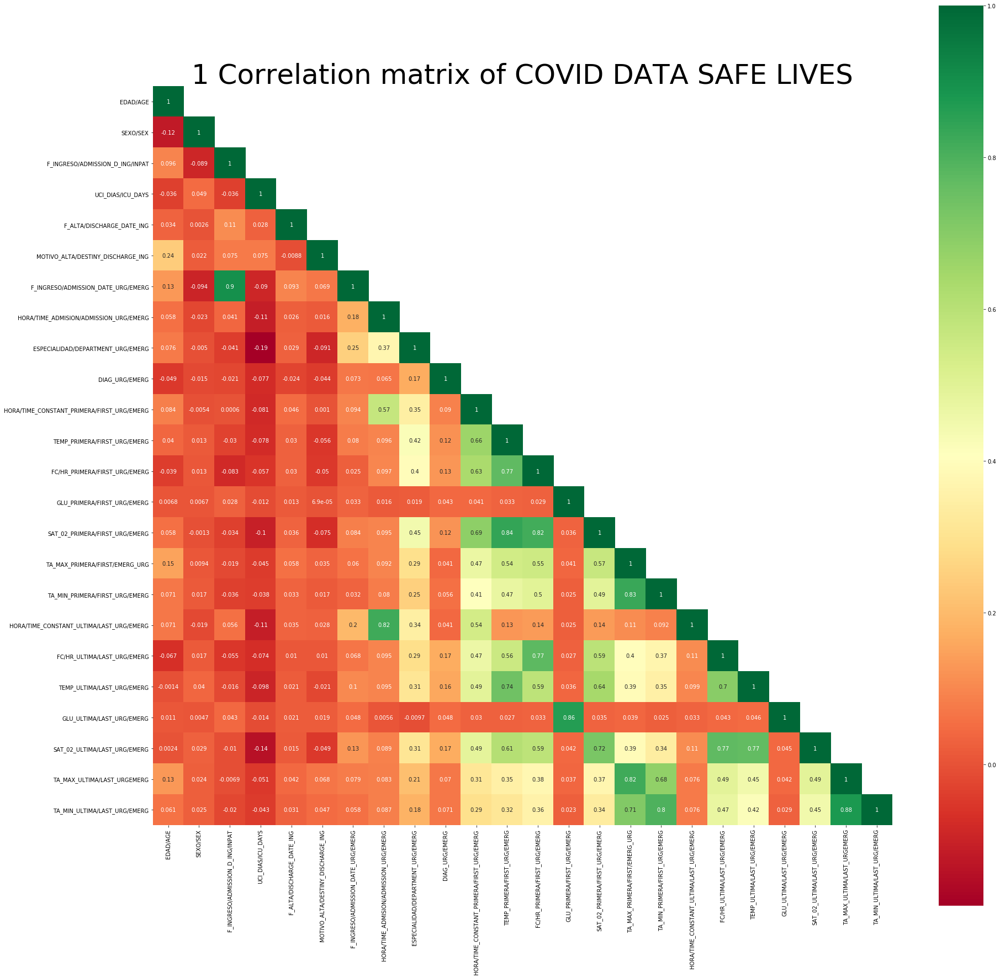

In [39]:
plt.figure(figsize=(30,30))
sns.heatmap(pr.corr(), annot=True, cmap="RdYlGn", square=True, mask=np.triu(pr.corr(), k=1))
plt.title("1 Correlation matrix of COVID DATA SAFE LIVES",fontsize=50)
plt.show()

A large positive value (close to 1.0) indicates a strong positive correlation (we will consider in our case >75% strongly correlated), that is, if the value of one of the variables increases, the value of the other variable increases also.

FC/HR_PRIMERA/FIRST_URG/EMERG -- TEMP_PRIMERA/FIRST_URG/EMERG

SAT_02_PRIMERA/FIRST_URG/EMERG -- TEMP_PRIMERA/FIRST_URG/EMERG

SAT_02_PRIMERA/FIRST_URG/EMERG -- FC/HR_PRIMERA/FIRST_URG/EMERG

TA_MIN_PRIMERA/FIRST_URG/EMERG -- TA_MAX_PRIMERA/FIRST/EMERG_URG

HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG -- HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG

FC/HR_ULTIMA/LAST_URG/EMERG -- FC/HR_PRIMERA/FIRST_URG/EMERG

GLU_ULTIMA/LAST_URG/EMERG -- GLU_PRIMERA/FIRST_URG/EMERG

SAT_02_ULTIMA/LAST_URG/EMERG -- FC/HR_ULTIMA/LAST_URG/EMERG

SAT_02_ULTIMA/LAST_URG/EMERG -- TEMP_ULTIMA/LAST_URG/EMERG

TA_MAX_ULTIMA/LAST_URGEMERG -- TA_MAX_PRIMERA/FIRST/EMERG_URG

TA_MIN_ULTIMA/LAST_URG/EMERG -- TA_MIN_PRIMERA/FIRST_URG/EMERG

TA_MIN_ULTIMA/LAST_URG/EMERG -- TA_MAX_ULTIMA/LAST_URGEMERG

### General

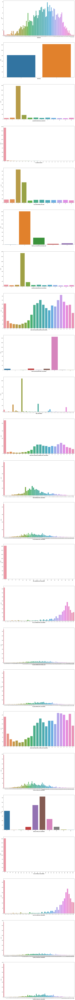

In [40]:
col_numeric = list(pr.select_dtypes(exclude="object"))
# visualizing the other categorical variables
plt.figure(figsize=(20,300))
for i,col in enumerate(col_numeric, start=1):
    plt.subplot(25,1,i)
    plt.xticks(rotation=90)
    sns.countplot(pr[col])
    plt.xlabel(col, fontsize=10,fontweight="bold")
plt.show()

In [41]:
#mediana edad(45~64)
100.*((pr['EDAD/AGE'] >= 45) & (pr['EDAD/AGE'] <= 64)).sum()/len(pr.index)

32.71484375

In [42]:
#anciana(65~)
100.*(pr['EDAD/AGE'] >= 65).sum()/len(pr.index)

57.51953125

EDAD/AGE: vemos una clara tendencia en la mediana edad(45~64 años) de 32,71% y anciana(65~ años) de 59,60%.

In [43]:
for col_name in pr.columns:
    print(pr[col_name].value_counts(normalize=True).head(7) * 100)

71    2.880859
74    2.636719
72    2.490234
64    2.490234
63    2.441406
76    2.441406
68    2.343750
Name: EDAD/AGE, dtype: float64
1    59.960938
0    40.039062
Name: SEXO/SEX, dtype: float64
3     67.285156
4      8.349609
6      3.027344
8      2.929688
5      2.783203
2      2.783203
12     2.587891
Name: F_INGRESO/ADMISSION_D_ING/INPAT, dtype: float64
0    94.433594
1     1.562500
2     0.585938
3     0.439453
6     0.341797
8     0.292969
5     0.292969
Name: UCI_DIAS/ICU_DAYS, dtype: float64
3     41.064453
4     25.195312
2      4.150391
1      3.906250
7      3.564453
6      3.515625
11     3.369141
Name: F_ALTA/DISCHARGE_DATE_ING, dtype: float64
1    79.003906
2    16.259766
4     3.027344
3     1.562500
0     0.146484
Name: MOTIVO_ALTA/DESTINY_DISCHARGE_ING, dtype: float64
3    65.332031
4     8.251953
6     3.125000
0     3.125000
8     2.880859
2     2.832031
5     2.441406
Name: F_INGRESO/ADMISSION_DATE_URG/EMERG, dtype: float64
19    8.105469
12    6.884766
18    6.8

SEXO/SEX: hay más probabilidad de contagio en los hombres de un 59,9%.

F_INGRESO/ADMISSION_D_ING/INPAT: vemos una pico en el transcurso de la pandemia en Mayo de 69,18%.

UCI_DIAS/ICU_DAYS: mayormente no pasan más de un día en la UCI con un valor de 94,43%.

F_ALTA/DISCHARGE_DATE_ING: al parecer se muestra una saturación en el hospital ya que no ingresaron a todos aquellos pacientes en Mayo de 37,45%.

In [44]:
print(100.*((pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'] < 2).sum())/len(pr.index))
100.*((pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'] == 3).sum()+(pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'] ==4).sum())/len(pr.index)

79.150390625


4.58984375

MOTIVO_ALTA/DESTINY_DISCHARGE_ING: tratamos una parte sanado(0,1) 79,15% , enfermo(3,4) 4,58% y fallecido(2) 16,25%.

F_INGRESO/ADMISSION_DATE_URG/EMERG: vemos mayoritariamente en Mayo un 66,79% y en Abril un 29,83%.

In [45]:
sin = pr[(pr[['HORA/TIME_ADMISION/ADMISSION_URG/EMERG']] != 0).all(axis=1)]

In [46]:
100.*((sin['HORA/TIME_ADMISION/ADMISSION_URG/EMERG'] >= 12).sum())/len(sin.index)

73.40259740259741

HORA/TIME_ADMISION/ADMISSION_URG/EMERG: vemos una tendencia en la hora de mayor actividad humana (12am - 0am) 73.40%.

ESPECIALIDAD/DEPARTMENT_URG/EMERG: claro pico en Medicina de Urgencias(6) con un 89,11%.

DIAG_URG/EMERG: los síntomas más característicos son DIFICULTAD RESPIRATORIA(12) con 52,24% ,12,5% FIEBRE(23) y 11,32% CUADRO CATARRAL(6).

In [47]:
sin = pr[(pr[['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG']] != 0).all(axis=1)]
100.*((sin['HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG'] > 11).sum())/len(sin.index)

74.70478558110628

HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG: 74,70% toma de muestras en hora de mayor actividad humana. 

In [48]:
sin = pr[(pr[['TEMP_PRIMERA/FIRST_URG/EMERG']] != 0).all(axis=1)]

In [49]:
100.*((sin['TEMP_PRIMERA/FIRST_URG/EMERG'] > 37.2).sum())/len(sin.index)

22.36925015752993

TEMP_PRIMERA/FIRST_URG/EMERG: al parecer no empiezan a tener síntomas de fiebres con un 22,36%.

In [50]:
sin = pr[(pr[['FC/HR_PRIMERA/FIRST_URG/EMERG']] != 0).all(axis=1)]
100.*((sin['FC/HR_PRIMERA/FIRST_URG/EMERG'] > 100).sum())/len(sin.index)

25.870646766169155

In [51]:
100.*((sin['FC/HR_PRIMERA/FIRST_URG/EMERG'] < 60).sum())/len(sin.index)

2.36318407960199

FC/HR_PRIMERA/FIRST_URG/EMERG: considerando las unidad de muestra como latidos por minuto, si la frecuencia cardíaca es rápida (más de 100 latidos por minuto) con 25,87%, se denomina taquicardia. Una frecuencia cardíaca de menos de 60 se denomina bradicardia con 2,36%. 
    
GLU_PRIMERA/FIRST_URG/EMERG: es un dato bastante irrelevante ya que no muestra mucha tendencia y además por la cantidad de missing values.

In [52]:
sin = pr[(pr[['SAT_02_PRIMERA/FIRST_URG/EMERG']] != 0).all(axis=1)]
100.*((sin['SAT_02_PRIMERA/FIRST_URG/EMERG'] >= 95) & (sin['SAT_02_PRIMERA/FIRST_URG/EMERG'] <= 100)).sum()/len(sin.index)

46.44607843137255

SAT_02_PRIMERA/FIRST_URG/EMERG: se considera saturación de sangre normal entre 95%~100% con solo 46,44%.

In [53]:
sin = pr[(pr[['TA_MAX_PRIMERA/FIRST/EMERG_URG']] != 0).all(axis=1)]
100.*((sin['TA_MAX_PRIMERA/FIRST/EMERG_URG'] >= 130).sum())/len(sin.index)

53.72217958557176

TA_MAX_PRIMERA/FIRST/EMERG_URG: la presión arterial se expresa en dos números, como por ejemplo 112/78 mm Hg. El primer número (sistólico >=130), es la presión cuando late el corazón. El segundo número (diastólico <90) es la presión cuando el corazón descansa entre latidos. Por los datos presentados consideramos medida sistólica, con un 53,72% de presión arterial alta.

In [54]:
sin = pr[(pr[['TA_MIN_PRIMERA/FIRST_URG/EMERG']] != 0).all(axis=1)]
100.*((sin['TA_MIN_PRIMERA/FIRST_URG/EMERG'] < 90).sum())/len(sin.index)

86.6462010744436

TA_MIN_PRIMERA/FIRST_URG/EMERG: una lectura de la tensión arterial inferior a 90 milímetros de mercurio (mm Hg) para el número superior (sistólica) se considera presión arterial baja.

In [55]:
sin = pr[(pr[['HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG']] != 0).all(axis=1)]
100.*((sin['HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG'] > 11).sum())/len(sin.index)

75.05219206680584

HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG: 75,05% toma de muestras en hora de mayor actividad humana.

In [56]:
sin = pr[(pr[['FC/HR_ULTIMA/LAST_URG/EMERG']] != 0).all(axis=1)]
100.*((sin['FC/HR_ULTIMA/LAST_URG/EMERG'] < 60).sum())/len(sin.index)

2.2300469483568075

In [57]:
100.*((sin['FC/HR_ULTIMA/LAST_URG/EMERG'] > 100).sum())/len(sin.index)

26.349765258215964

FC/HR_ULTIMA/LAST_URG/EMERG: considerando las unidad de muestra como latidos por minuto, la frecuencia cardíaca alta(taquicardia) con 26,34% y frecuencia cardíaca baja(bradicardia) con 2,23%. 

In [58]:
sin = pr[(pr[['TEMP_ULTIMA/LAST_URG/EMERG']] != 0.0).all(axis=1)]
100.*((sin['TEMP_ULTIMA/LAST_URG/EMERG'] > 37.2).sum())/len(sin.index)

18.71559633027523

TEMP_ULTIMA/LAST_URG/EMERG: al acabar pocos tienen síntomas de fiebres con un 18.71%.

GLU_ULTIMA/LAST_URG/EMERG: es un dato bastante irrelevante ya que no muestra mucha tendencia y además por la cantidad de missing values.

In [59]:
sin = pr[(pr[['SAT_02_ULTIMA/LAST_URG/EMERG']] != 0).all(axis=1)]
100.*((sin['SAT_02_ULTIMA/LAST_URG/EMERG'] >= 95) & (sin['SAT_02_ULTIMA/LAST_URG/EMERG'] <= 100)).sum()/len(sin.index)

45.370370370370374

SAT_02_ULTIMA/LAST_URG/EMERG: la saturación de sangre normal entre 95%~100% con solo 45,37%.

In [60]:
sin = pr[(pr[['TA_MIN_ULTIMA/LAST_URG/EMERG']] != 0).all(axis=1)]
100.*((sin['TA_MIN_ULTIMA/LAST_URG/EMERG'] < 90).sum())/len(sin.index)

86.12926652142339

In [61]:
sin = pr[(pr[['TA_MAX_ULTIMA/LAST_URGEMERG']] != 0).all(axis=1)]
100.*((sin['TA_MAX_ULTIMA/LAST_URGEMERG'] >= 130).sum())/len(sin.index)

53.95787944807552

TA_MAX_ULTIMA/LAST_URGEMERG: un 53,95% con presión arterial alta.

TA_MIN_ULTIMA/LAST_URG/EMERG: un 86,12% con presión arterial baja.

In [62]:
s_filter = pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING']<2
e_filter =(pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING']==3 )+ (pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING']==4)
f_filter = pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING']==2

### Sanados

In [63]:
for col_name in pr[s_filter].columns:
    print(pr[s_filter][col_name].value_counts(normalize=True).head(7) * 100)

71    3.146206
74    2.776064
63    2.776064
64    2.590993
57    2.590993
72    2.529303
62    2.467613
Name: EDAD/AGE, dtype: float64
1    59.099321
0    40.900679
Name: SEXO/SEX, dtype: float64
3    68.969772
4     7.958051
5     2.899445
2     2.899445
8     2.776064
6     2.590993
7     2.405922
Name: F_INGRESO/ADMISSION_D_ING/INPAT, dtype: float64
0    95.928439
1     1.542258
2     0.370142
3     0.308452
5     0.246761
4     0.246761
8     0.185071
Name: UCI_DIAS/ICU_DAYS, dtype: float64
3     40.592227
4     24.182603
2      4.565083
6      3.948180
1      3.948180
7      3.701419
10     3.578038
Name: F_ALTA/DISCHARGE_DATE_ING, dtype: float64
1    99.814929
0     0.185071
Name: MOTIVO_ALTA/DESTINY_DISCHARGE_ING, dtype: float64
3    67.427514
4     7.896360
2     2.961135
6     2.776064
8     2.714374
5     2.529303
0     2.529303
Name: F_INGRESO/ADMISSION_DATE_URG/EMERG, dtype: float64
19    8.143122
18    7.217767
11    6.971006
12    6.971006
20    6.045651
10    5.983961
2

EDAD/AGE: clara tendencia a edades <75.

SEXO/SEX: N

F_INGRESO/ADMISSION_D_ING/INPAT: N

UCI_DIAS/ICU_DAYS: los sanados a penas ingresaron a UCI.

F_ALTA/DISCHARGE_DATE_ING: N

MOTIVO_ALTA/DESTINY_DISCHARGE_ING: 99,81% de alta DOMICILIO.

F_INGRESO/ADMISSION_DATE_URG/EMERG: N

HORA/TIME_ADMISION/ADMISSION_URG/EMERG: N

ESPECIALIDAD/DEPARTMENT_URG/EMERG: N

DIAG_URG/EMERG: N

HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG: N

TEMP_PRIMERA/FIRST_URG/EMERG: N

FC/HR_PRIMERA/FIRST_URG/EMERG: N

GLU_PRIMERA/FIRST_URG/EMERG: N

SAT_02_PRIMERA/FIRST_URG/EMERG: N

TA_MAX_PRIMERA/FIRST/EMERG_URG: N

TA_MIN_PRIMERA/FIRST_URG/EMERG: N

HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG: tendencia a partir de las 18-22

FC/HR_ULTIMA/LAST_URG/EMERG: N

TEMP_ULTIMA/LAST_URG/EMERG: N

GLU_ULTIMA/LAST_URG/EMERG: N

SAT_02_ULTIMA/LAST_URG/EMERG: N

TA_MAX_ULTIMA/LAST_URGEMERG: N

TA_MIN_ULTIMA/LAST_URG/EMERG: N

### Enfermos

In [64]:
for col_name in pr[e_filter].columns:
    print(pr[e_filter][col_name].value_counts(normalize=True).head(7) * 100)

68    5.319149
79    4.255319
86    4.255319
66    4.255319
47    4.255319
76    3.191489
77    3.191489
Name: EDAD/AGE, dtype: float64
1    55.319149
0    44.680851
Name: SEXO/SEX, dtype: float64
3     48.936170
4     15.957447
8      6.382979
12     5.319149
10     5.319149
7      4.255319
9      3.191489
Name: F_INGRESO/ADMISSION_D_ING/INPAT, dtype: float64
0    95.744681
6     2.127660
4     1.063830
3     1.063830
Name: UCI_DIAS/ICU_DAYS, dtype: float64
3     41.489362
4     39.361702
9      5.319149
12     4.255319
11     4.255319
10     1.063830
8      1.063830
Name: F_ALTA/DISCHARGE_DATE_ING, dtype: float64
4    65.957447
3    34.042553
Name: MOTIVO_ALTA/DESTINY_DISCHARGE_ING, dtype: float64
3     47.872340
4     14.893617
8      6.382979
12     5.319149
10     5.319149
6      4.255319
9      3.191489
Name: F_INGRESO/ADMISSION_DATE_URG/EMERG, dtype: float64
22    10.638298
20    10.638298
12     7.446809
16     7.446809
15     6.382979
23     6.382979
21     6.382979
Name: HORA

EDAD/AGE: clara tendencia a mayores edades >47.

SEXO/SEX: N

F_INGRESO/ADMISSION_D_ING/INPAT: N

UCI_DIAS/ICU_DAYS: los enfermos ingresan más días aunque no lleguen la mayoría a 1.

F_ALTA/DISCHARGE_DATE_ING: N

MOTIVO_ALTA/DESTINY_DISCHARGE_ING: 65,95% de alta TRASLADO AL HOSPITAL y 34,04% de alta TRASLADO A CENTRO SOCIOSANITARIO.

F_INGRESO/ADMISSION_DATE_URG/EMERG: N

HORA/TIME_ADMISION/ADMISSION_URG/EMERG: mayor tendencia nocturna 20 y 22 con 10.63%.

ESPECIALIDAD/DEPARTMENT_URG/EMERG: N + 15,95% de Medicina General.

DIAG_URG/EMERG: N

HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG: N

TEMP_PRIMERA/FIRST_URG/EMERG: N

FC/HR_PRIMERA/FIRST_URG/EMERG: 103 con un 5,31%.

GLU_PRIMERA/FIRST_URG/EMERG: N

SAT_02_PRIMERA/FIRST_URG/EMERG: N

TA_MAX_PRIMERA/FIRST/EMERG_URG: N

TA_MIN_PRIMERA/FIRST_URG/EMERG: N

HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG: tendencia a partir de las 18-22.

FC/HR_ULTIMA/LAST_URG/EMERG: mayor frecuencia cardiaca.

TEMP_ULTIMA/LAST_URG/EMERG: N

GLU_ULTIMA/LAST_URG/EMERG: N

SAT_02_ULTIMA/LAST_URG/EMERG: N

TA_MAX_ULTIMA/LAST_URGEMERG: N

TA_MIN_ULTIMA/LAST_URG/EMERG: el doble de probabilidad con diastólico.

### Fallecidos

In [65]:
for col_name in pr[f_filter].columns:
    print(pr[f_filter][col_name].value_counts(normalize=True).head(10) * 100)

89    6.606607
80    6.306306
84    4.504505
88    4.504505
79    3.903904
83    3.903904
85    3.903904
75    3.603604
76    3.303303
77    3.303303
Name: EDAD/AGE, dtype: float64
1    65.465465
0    34.534535
Name: SEXO/SEX, dtype: float64
3     64.264264
4      8.108108
6      5.105105
12     3.303303
9      3.303303
1      3.003003
8      2.702703
5      2.702703
11     2.402402
2      2.402402
Name: F_INGRESO/ADMISSION_D_ING/INPAT, dtype: float64
0     86.786787
1      2.102102
2      1.801802
11     1.201201
8      0.900901
3      0.900901
6      0.900901
7      0.900901
5      0.600601
10     0.600601
Name: UCI_DIAS/ICU_DAYS, dtype: float64
3     43.243243
4     26.126126
1      4.504505
11     4.204204
7      3.903904
8      3.003003
2      3.003003
12     2.702703
10     2.702703
6      2.402402
Name: F_ALTA/DISCHARGE_DATE_ING, dtype: float64
2    100.0
Name: MOTIVO_ALTA/DESTINY_DISCHARGE_ING, dtype: float64
3     60.060060
4      8.108108
0      6.006006
6      4.504505
9    

EDAD/AGE: clara tendencia a mayores edades >47.

SEXO/SEX: 65,46% hombres.

F_INGRESO/ADMISSION_D_ING/INPAT: 69,96% en Mayo.

UCI_DIAS/ICU_DAYS: los enfermos ingresan más días aunque no lleguen la mayoría a 1 día.

F_ALTA/DISCHARGE_DATE_ING: 

MOTIVO_ALTA/DESTINY_DISCHARGE_ING: N

F_INGRESO/ADMISSION_DATE_URG/EMERG: 64,56% en Mayo.

HORA/TIME_ADMISION/ADMISSION_URG/EMERG: N

ESPECIALIDAD/DEPARTMENT_URG/EMERG: hay bastante missing value en los fallecidos, podría significar que no le derivaron a ninguna especialidad.

DIAG_URG/EMERG: 55,55% con dificultad resporatoria.

HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG: N

TEMP_PRIMERA/FIRST_URG/EMERG: N

FC/HR_PRIMERA/FIRST_URG/EMERG: apenas valores superior a 100.

GLU_PRIMERA/FIRST_URG/EMERG: N

SAT_02_PRIMERA/FIRST_URG/EMERG: N

TA_MAX_PRIMERA/FIRST/EMERG_URG: N

TA_MIN_PRIMERA/FIRST_URG/EMERG: N

HORA/TIME_CONSTANT_ULTIMA/LAST_URG/EMERG: muchos ni le llegaron a tomar las constantes vitales.

FC/HR_ULTIMA/LAST_URG/EMERG: N

TEMP_ULTIMA/LAST_URG/EMERG: N

GLU_ULTIMA/LAST_URG/EMERG: N

SAT_02_ULTIMA/LAST_URG/EMERG: N

TA_MAX_ULTIMA/LAST_URGEMERG: N

TA_MIN_ULTIMA/LAST_URG/EMERG: tendencia clave de diastólicos.

In [66]:
#We save a csv copy of the cleaned data
pr.to_csv("DataFrame1_Limpio.csv",sep=',')

## Creating Dependent and Independent Variables

In [67]:
pr.applymap(str)
pr.applymap(str).iloc[0,0]
pr = pr.applymap(str)
# independent variables
X = pr.drop(['MOTIVO_ALTA/DESTINY_DISCHARGE_ING'],axis=1)
test_features = X.columns.to_list()
# dependent variable
y = pr['MOTIVO_ALTA/DESTINY_DISCHARGE_ING']

## Splitting data into train test data

In [68]:
# splitting into train and test data
# I will train using 90% of the data to enhanced accuracy
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)

# Modelling

## Decision Trees

In [69]:
model = DecisionTreeClassifier()
model = model.fit(X_train,y_train)
predictions = model.predict(X_test)
score = accuracy_score(y_test,predictions)*100
print('Decision Tree Classifier Training Accuracy:', score,'%')

Decision Tree Classifier Training Accuracy: 74.63414634146342 %


In [70]:
prediction = model.predict([[20,1,4,4,0,1,0,10,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0]])
prediction

array(['1'], dtype=object)

In [71]:
tree.export_graphviz(model, out_file = 'covid_decisiontree.dot')
dotfile = StringIO()
tree.export_graphviz(model, out_file=dotfile,filled = True, rounded = True, 
                    feature_names = test_features, class_names = sorted(y.unique()), label = 'all')
graph = pydotplus.graph_from_dot_data(dotfile.getvalue())
graph.write_png('covid_tree.png')
Image(graph.create_png())

## Random Forest Classifier

In [72]:
forest = RandomForestClassifier(n_estimators=100)
forest = forest.fit(X_train,y_train)
predictions = forest.predict(X_test)
score = accuracy_score(y_test,predictions)*100
print('Random Forest Classifier Training Accuracy:', score,'%')

Random Forest Classifier Training Accuracy: 82.92682926829268 %


In [73]:
prediction = forest.predict([[20,1,4,4,0,0,0,10,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0]])
prediction

array(['1'], dtype=object)

In [74]:
dot_data = StringIO()
# pick a specific tree from the forest
tree = forest.estimators_[50]
export_graphviz(tree, out_file = dot_data, filled = True, rounded = True, 
                    feature_names = test_features, class_names = sorted(y.unique()), label = 'all', special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('covid_forest.png')
Image(graph.create_png())

In [75]:
pr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2048 entries, 577 to 284
Data columns (total 24 columns):
EDAD/AGE                                      2048 non-null object
SEXO/SEX                                      2048 non-null object
F_INGRESO/ADMISSION_D_ING/INPAT               2048 non-null object
UCI_DIAS/ICU_DAYS                             2048 non-null object
F_ALTA/DISCHARGE_DATE_ING                     2048 non-null object
MOTIVO_ALTA/DESTINY_DISCHARGE_ING             2048 non-null object
F_INGRESO/ADMISSION_DATE_URG/EMERG            2048 non-null object
HORA/TIME_ADMISION/ADMISSION_URG/EMERG        2048 non-null object
ESPECIALIDAD/DEPARTMENT_URG/EMERG             2048 non-null object
DIAG_URG/EMERG                                2048 non-null object
HORA/TIME_CONSTANT_PRIMERA/FIRST_URG/EMERG    2048 non-null object
TEMP_PRIMERA/FIRST_URG/EMERG                  2048 non-null object
FC/HR_PRIMERA/FIRST_URG/EMERG                 2048 non-null object
GLU_PRIMERA/FIRST_URG